In [2]:

# Step 1: Install system-level build tools for pycocotools
!apt-get update && apt-get install -y libgl1-mesa-glx libglib2.0-0 build-essential

# Step 2: Install required Python packages
!pip install -q cython pycocotools

# Step 3: Install the main super-gradients library
!pip install -q super-gradients

Hit:1 http://archive.ubuntu.com/ubuntu focal InRelease
Hit:2 http://archive.ubuntu.com/ubuntu focal-updates InRelease                 
Hit:3 http://archive.ubuntu.com/ubuntu focal-backports InRelease               
Get:4 http://packages.cloud.google.com/apt gcsfuse-focal InRelease [1227 B]    
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:6 https://packages.cloud.google.com/apt cloud-sdk InRelease [1618 B]       
Get:7 https://packages.cloud.google.com/apt google-fast-socket InRelease [1071 B]
Hit:8 http://security.ubuntu.com/ubuntu focal-security InRelease
Err:4 http://packages.cloud.google.com/apt gcsfuse-focal InRelease
  The following signatures couldn't be verified because the public key is not available: NO_PUBKEY C0BA5CE6DC6315A3
Err:6 https://packages.cloud.google.com/apt cloud-sdk InRelease
  The following signatures couldn't be verified because the public key is not available: NO_PUBKEY C0BA5CE6DC6315A3
Err:7 https://packages.

In [9]:
import os, shutil, json, csv, random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
DATASET_PATH = '/kaggle/working/coco_airport_dataset' # This will be our main data directory
CATEGORIES = [
    {'id': 0, 'name': 'Airside Safety Vehicle'}, {'id': 1, 'name': 'Ambulance Vehicle'},
    {'id': 2, 'name': 'Business Jet'}, {'id': 3, 'name': 'Cargo Airplane'},
    {'id': 4, 'name': 'Cleaning Vehicle'}, {'id': 5, 'name': 'Common Aircraft'},
    {'id': 6, 'name': 'Container Trolley'}, {'id': 7, 'name': 'Container Trolley Type A'},
    {'id': 8, 'name': 'Container Trolley Type B'}, {'id': 9, 'name': 'Container Trolley Type C'},
    {'id': 10, 'name': 'Conveyer Vehicle'}, {'id': 11, 'name': 'Fire Truck'},
    {'id': 12, 'name': 'Forklift'}, {'id': 13, 'name': 'Helicopter'},
    {'id': 14, 'name': 'Loading Ramp'}, {'id': 15, 'name': 'Loading Vehicle'},
    {'id': 16, 'name': 'Other Objects'}, {'id': 17, 'name': 'Other Vehicles'},
    {'id': 18, 'name': 'Passenger Bus'}, {'id': 19, 'name': 'Passenger Jet'},
    {'id': 20, 'name': 'Passenger Stairway'}, {'id': 21, 'name': 'Pedestrian Crossing'},
    {'id': 22, 'name': 'Person Wearing Reflective Vests'}, {'id': 23, 'name': 'Rescue Helicopter'},
    {'id': 24, 'name': 'Sanitary Truck'}, {'id': 25, 'name': 'Snowplow'},
    {'id': 26, 'name': 'Speed Limit 30'}, {'id': 27, 'name': 'Standard Car'},
    {'id': 28, 'name': 'Standard Truck'}, {'id': 29, 'name': 'Tank Truck'},
    {'id': 30, 'name': 'Taxiing Vehicle'}, {'id': 31, 'name': 'Tow Vehicle'},
    {'id': 32, 'name': 'Tractor'}, {'id': 33, 'name': 'Traffic Barrier'},
    {'id': 34, 'name': 'Traffic Cone'}, {'id': 35, 'name': 'Traffic Cone - Off'},
    {'id': 36, 'name': 'Traffic Cone - On'}, {'id': 37, 'name': 'Traffic Cone - Standard'},
    {'id': 38, 'name': 'Traffic Sign'}, {'id': 39, 'name': 'Transport Container'},
    {'id': 40, 'name': 'Transport Vehicle'}, {'id': 41, 'name': 'Warning Sign'},
    {'id': 42, 'name': 'Person'}
]
CLASS_NAMES = [cat['name'] for cat in CATEGORIES]
NUM_CLASSES = len(CLASS_NAMES)

if os.path.exists(DATASET_PATH): shutil.rmtree(DATASET_PATH)
# Standard COCO directory structure
train_img_dir = os.path.join(DATASET_PATH, 'train2017')
val_img_dir = os.path.join(DATASET_PATH, 'val2017')
ann_dir = os.path.join(DATASET_PATH, 'annotations')
os.makedirs(train_img_dir, exist_ok=True); os.makedirs(val_img_dir, exist_ok=True); os.makedirs(ann_dir, exist_ok=True)

def convert_to_coco(image_filenames, image_dir, anno_path):
    coco_data = {"info": {}, "licenses": [], "images": [], "annotations": [], "categories": CATEGORIES}
    annotation_id_counter = 0
    print(f"Processing data for {os.path.basename(anno_path)}...")
    for image_id, img_file in enumerate(tqdm(image_filenames)):
        shutil.copy(os.path.join(IMAGES_PATH, img_file), image_dir)
        try:
            with Image.open(os.path.join(IMAGES_PATH, img_file)) as img: width, height = img.size
            coco_data["images"].append({"id": image_id, "width": width, "height": height, "file_name": img_file})
            bbox_file = os.path.splitext(img_file)[0] + '.csv'
            bbox_path = os.path.join(BBOXES_PATH, bbox_file)
            if os.path.exists(bbox_path):
                with open(bbox_path, 'r') as f:
                    reader = csv.DictReader(f)
                    for row in reader:
                        class_id = int(row['label'])
                        if 0 <= class_id < NUM_CLASSES:
                            xmin, ymin, xmax, ymax = float(row['tlx']), float(row['tly']), float(row['brx']), float(row['bry'])
                            w, h = xmax - xmin, ymax - ymin
                            coco_data["annotations"].append({"id": annotation_id_counter, "image_id": image_id, "category_id": class_id, "bbox": [xmin, ymin, w, h], "area": w * h, "iscrowd": 0, "segmentation": []})
                            annotation_id_counter += 1
        except Exception as e: print(f"Skipping {img_file} due to error: {e}")
    with open(anno_path, 'w') as f: json.dump(coco_data, f, indent=4)
    print(f"Created {anno_path}")

all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42); random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files, val_files = all_image_files[:split_index], all_image_files[split_index:]

# Create the train and validation sets with the standard COCO filenames
convert_to_coco(train_files, train_img_dir, os.path.join(ann_dir, 'instances_train2017.json'))
convert_to_coco(val_files, val_img_dir, os.path.join(ann_dir, 'instances_val2017.json'))
print("\nDataset preparation is complete! ✅")

  0%|          | 0/7275 [00:00<?, ?it/s]

Processing data for instances_train2017.json...


  0%|          | 0/809 [00:00<?, ?it/s]

Created /kaggle/working/coco_airport_dataset/annotations/instances_train2017.json
Processing data for instances_val2017.json...
Created /kaggle/working/coco_airport_dataset/annotations/instances_val2017.json

Dataset preparation is complete! ✅


In [21]:
import torch
from super_gradients.training.datasets import COCODetectionDataset
from super_gradients.training.transforms.transforms import DetectionMosaic, DetectionRandomAffine, DetectionHSV, \
    DetectionPaddedRescale, DetectionStandardize, DetectionTargetsFormatTransform
from super_gradients.training.utils.collate_fn import CrowdDetectionCollateFN

# --- 1. Define Transforms/Augmentations ---
train_transforms = [
    DetectionMosaic(input_dim=(640, 640), prob=1.),
    DetectionRandomAffine(degrees=0., translate=.1, scales=.5, shear=0., target_size=(640, 640)),
    DetectionHSV(hgain=5, sgain=30, vgain=30, prob=1.0),
    DetectionPaddedRescale(input_dim=(640, 640)),
    DetectionStandardize(max_value=255.),
    DetectionTargetsFormatTransform(input_format="xyxy_label", output_format="LABEL_CXCYWH")
]
val_transforms = [
    DetectionPaddedRescale(input_dim=(640, 640)),
    DetectionStandardize(max_value=255.),
    DetectionTargetsFormatTransform(input_format="xyxy_label", output_format="LABEL_CXCYWH")
]

# --- 2. Create the Datasets using the correct keyword arguments ---
# --- THE FIX: Provide only the filename to 'json_file' ---
train_dataset = COCODetectionDataset(
    data_dir=DATASET_PATH,
    json_file='instances_train2017.json',
    subdir='train2017',
    transforms=train_transforms
)

val_dataset = COCODetectionDataset(
    data_dir=DATASET_PATH,
    json_file='instances_val2017.json',
    subdir='val2017',
    transforms=val_transforms
)

# --- 3. Create the PyTorch DataLoaders ---
train_data = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=4,
    num_workers=2,
    collate_fn=CrowdDetectionCollateFN()
)

val_data = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=8,
    num_workers=2,
    collate_fn=CrowdDetectionCollateFN()
)

print("Dataloaders created successfully! ✅")

loading annotations into memory...
Done (t=11.64s)
creating index...
index created!


[2025-08-12 12:09:34] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 7275/7275 [00:04<00:00, 1511.61it/s]
[2025-08-12 12:09:39] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations:   0%|          | 0/809 [00:00<?, ?it/s]

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


Indexing dataset annotations: 100%|██████████| 809/809 [00:00<00:00, 1599.36it/s]


Dataloaders created successfully! ✅


In [25]:
import torch
from PIL import Image, ImageDraw, ImageFont
from super_gradients.training import models
from IPython.display import display
import os

# --- 1. DEFINE YOUR PATHS ---

# This should be the path to the pre-trained weights file you downloaded.
# For example: '/kaggle/working/yolo_nas_l_coco.pth' or '/kaggle/input/yolo-nas-pytorch/yolo_nas_l_coco.pth'
CHECKPOINT_PATH = "/kaggle/working/yolo_nas_l.pt" # <--- CHANGE THIS

# This should be the path to the specific image you want to test.
# For example: '/kaggle/input/airportvehicledataset/images/aut-0003-00004142.jpg'
YOUR_IMAGE_PATH = "path/to/your/image.jpg" # <--- CHANGE THIS

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- 2. LOAD THE PRE-TRAINED MODEL FROM YOUR LOCAL FILE ---
print("--- Loading the pre-trained YOLO-NAS model from local file ---")
try:
    # We load the model with num_classes=80 because that's what the COCO weights were trained on.
    model = models.get('yolo_nas_l',
                       num_classes=80,
                       checkpoint_path=CHECKPOINT_PATH)
    model = model.to(DEVICE)
    print(f"Model loaded successfully from: {CHECKPOINT_PATH} ✅")

    # --- 3. RUN INFERENCE AND VISUALIZE THE RESULTS ---
    print(f"\n--- Running inference on: {os.path.basename(YOUR_IMAGE_PATH)} ---")
    
    # Load the image
    image = Image.open(YOUR_IMAGE_PATH).convert("RGB")
    
    # Run prediction
    predictions = model.predict(image, conf=0.5)
    prediction = predictions[0] # Get the first (and only) prediction

    # Prepare for drawing
    draw = ImageDraw.Draw(image)
    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf", size=20)
    except IOError:
        print("Default font not found. Using basic font.")
        font = ImageFont.load_default()

    # The pre-trained model uses COCO class names, which we get from the prediction object
    coco_class_names = prediction.class_names
    
    # Get the predicted boxes, scores, and labels
    bboxes = prediction.prediction.bboxes_xyxy
    confidences = prediction.prediction.confidence
    labels = prediction.prediction.labels.astype(int)

    if len(bboxes) > 0:
        for box, conf, label_id in zip(bboxes, confidences, labels):
            x1, y1, x2, y2 = box
            # Use the COCO class names for the label
            label_text = f"{coco_class_names[label_id]} {conf:.2f}"
            
            # Draw bounding box
            draw.rectangle([x1, y1, x2, y2], outline="lime", width=4)
            
            # Draw label background
            text_bbox = draw.textbbox((x1, y1 - 25), label_text, font=font)
            draw.rectangle(text_bbox, fill="lime")
            
            # Draw label text
            draw.text((x1, y1 - 25), label_text, fill="black", font=font)
        
        print("\nPrediction Results:")
        display(image)
    else:
        print("No objects detected with the current confidence threshold.")
        display(image)

except FileNotFoundError:
    print(f"ERROR: A file was not found. Please check your paths:")
    print(f"  - Checkpoint path: '{CHECKPOINT_PATH}'")
    print(f"  - Image path: '{YOUR_IMAGE_PATH}'")
except Exception as e:
    print(f"An error occurred: {e}")

[2025-08-12 12:17:49] INFO - checkpoint_utils.py - Successfully loaded model weights from /kaggle/input/yolo_nas/pytorch/default/1/yolo_nas_l_coco.pth checkpoint.
[2025-08-12 12:17:49] WARNING - sg_trainer.py - Train dataset size % batch_size != 0 and drop_last=False, this might result in smaller last batch.
[2025-08-12 12:17:49] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20250812_121749_705963`
[2025-08-12 12:17:49] INFO - sg_trainer.py - Checkpoints directory: /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963
/opt/conda/lib/python3.7/site-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `ppyoloe_loss` is now deprecated. Please replace it with `PPYoloELoss`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/opt/conda/lib/python3.7/site-packages/super_gradients/training/utils/optimizer_utils.py:113: DeprecationW

The console stream is now moved to /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/console_Aug12_12_17_49.txt


[2025-08-12 12:17:52] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            7266       (len(train_set))
    - Batch size per GPU:           4          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             4          (num_gpus * batch_size)
    - Effective Batch size:         4          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         1817       (len(train_loader))
    - Gradient updates per epoch:   1817       (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_L  (66.94M parameters, 66.94M optimized)
    - Learning Rates and Weight Decays:
      - default: (66.94M parameters). LR: 0.001 (66.94M parameters) WD: 0.01, (66.94M parameters)

[2025-08-12 12:17:52] INFO - sg_trainer.py - Started training for 2 epochs (0/1)

Validating: 100%|█

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.41
│   ├── Ppyoloeloss/loss_iou = 1.0187
│   ├── Ppyoloeloss/loss_dfl = 0.5968
│   ├── Ppyoloeloss/loss = 3.0255
│   ├── Precision@0.50 = 0.0133
│   ├── Recall@0.50 = 0.1181
│   ├── Map@0.50 = 0.0223
│   ├── F1@0.50 = 0.0216
│   └── Best_score_threshold = 0.25
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3224
    ├── Ppyoloeloss/loss_iou = 0.9004
    ├── Ppyoloeloss/loss_dfl = 0.5511
    ├── Ppyoloeloss/loss = 2.7739
    ├── Precision@0.50 = 0.0229
    ├── Recall@0.50 = 0.2232
    ├── Map@0.50 = 0.0618
    ├── F1@0.50 = 0.0363
    └── Best_score_threshold = 0.24



Validating epoch 1: 100%|██████████| 101/101 [00:28<00:00,  3.54it/s]
[2025-08-12 13:08:08] INFO - base_sg_logger.py - Checkpoint saved in /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth
[2025-08-12 13:08:08] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.12303720414638519


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2235
│   │   ├── Epoch N-1      = 1.41   (↘ -0.1865)
│   │   └── Best until now = 1.41   (↘ -0.1865)
│   ├── Ppyoloeloss/loss_iou = 0.8113
│   │   ├── Epoch N-1      = 1.0187 (↘ -0.2074)
│   │   └── Best until now = 1.0187 (↘ -0.2074)
│   ├── Ppyoloeloss/loss_dfl = 0.5029
│   │   ├── Epoch N-1      = 0.5968 (↘ -0.0939)
│   │   └── Best until now = 0.5968 (↘ -0.0939)
│   ├── Ppyoloeloss/loss = 2.5377
│   │   ├── Epoch N-1      = 3.0255 (↘ -0.4878)
│   │   └── Best until now = 3.0255 (↘ -0.4878)
│   ├── Precision@0.50 = 0.0237
│   │   ├── Epoch N-1      = 0.0133 (↗ 0.0104)
│   │   └── Best until now = 0.0133 (↗ 0.0104)
│   ├── Recall@0.50 = 0.2237
│   │   ├── Epoch N-1      = 0.1181 (↗ 0.1056)
│   │   └── Best until now = 0.1181 (↗ 0.1056)
│   ├── Map@0.50 = 0.0772
│   │   ├── Epoch N-1      = 0.0223 (↗ 0.055)
│   │   └── Best until now = 0.0223 (↗ 0.055)
│   ├── F1@0.50 = 0.0383
│   │   ├── Epoch N-1      = 0.0216 (↗ 0.0167)


[2025-08-12 13:08:11] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 2: 100%|██████████| 101/101 [00:28<00:00,  3.56it/s]
[2025-08-12 13:08:40] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process



Fine-tuning complete! Checkpoints saved in: /kaggle/working/yolonas_checkpoints ✅


--- Loading the best fine-tuned YOLO-NAS model ---


[2025-08-12 13:52:02] INFO - checkpoint_utils.py - Successfully loaded model weights from /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth checkpoint.


Successfully loaded model from: /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth ✅

--- Visualizing predictions on 5 random sample images ---


Predicting Images: 100%|██████████| 5/5 [00:00<00:00, 11.36it/s]



Predictions for: aut-0855-00001359.jpg


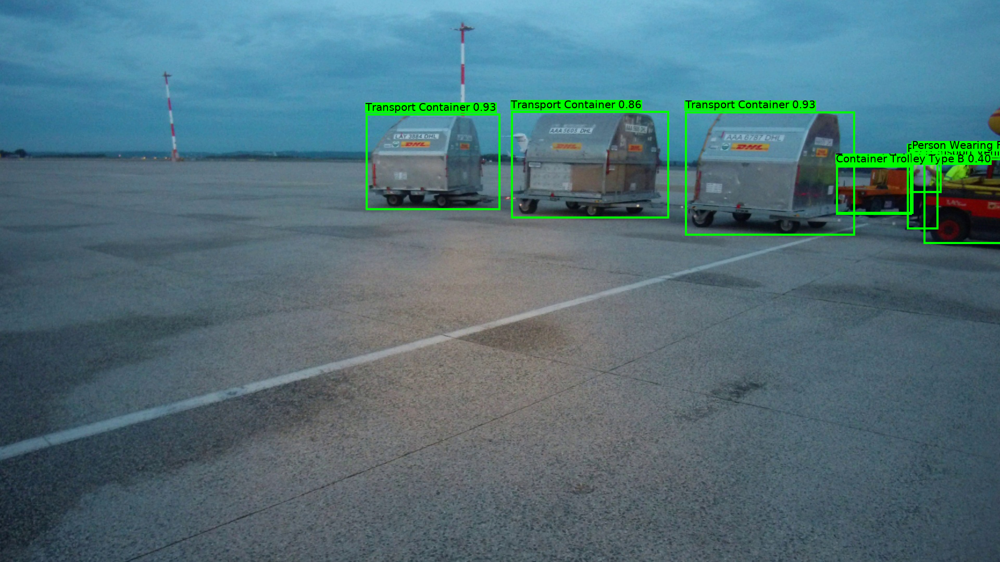


Predictions for: aut-1194-00000293.jpg


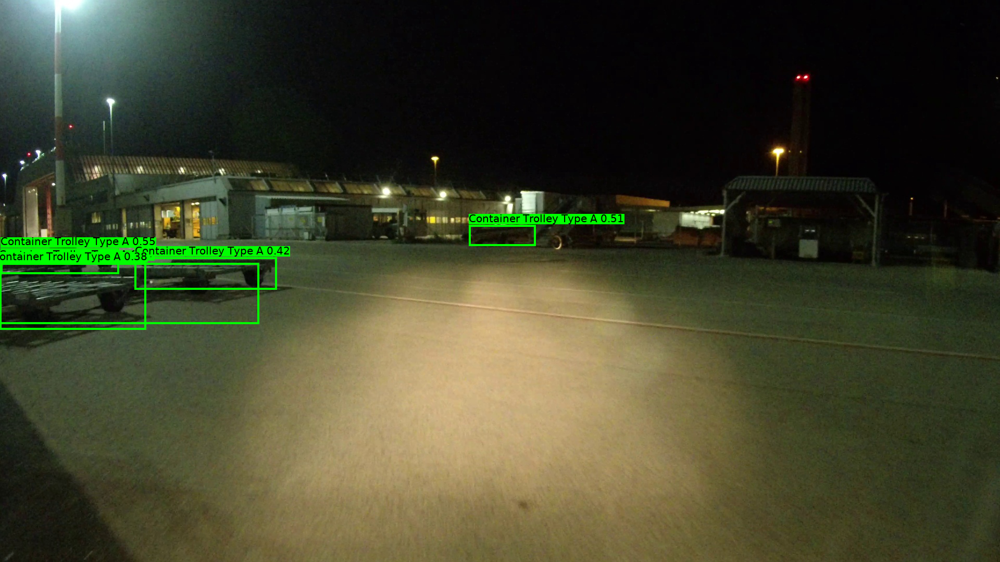


Predictions for: aut-0430-00001974.jpg


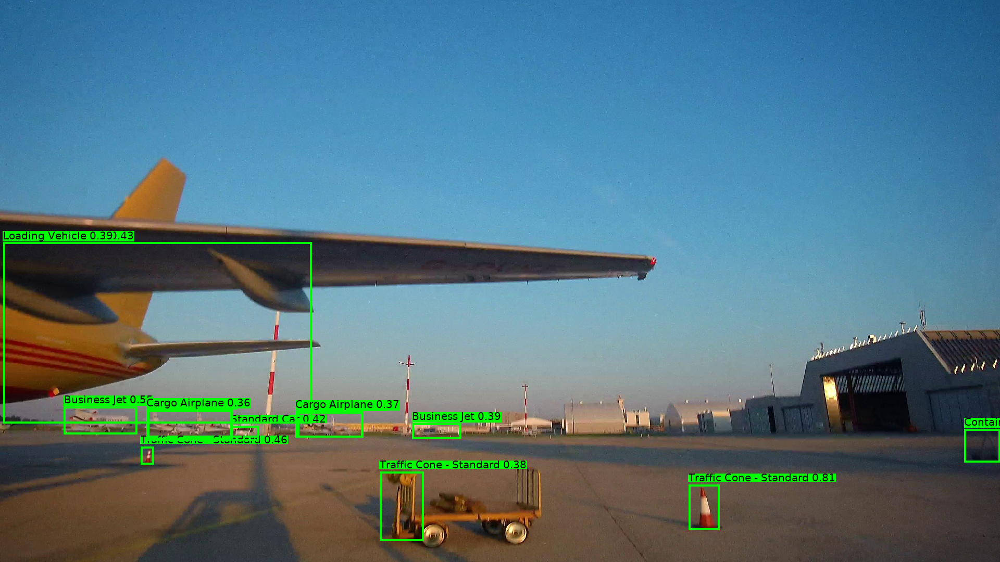


Predictions for: aut-1060-00003550.jpg


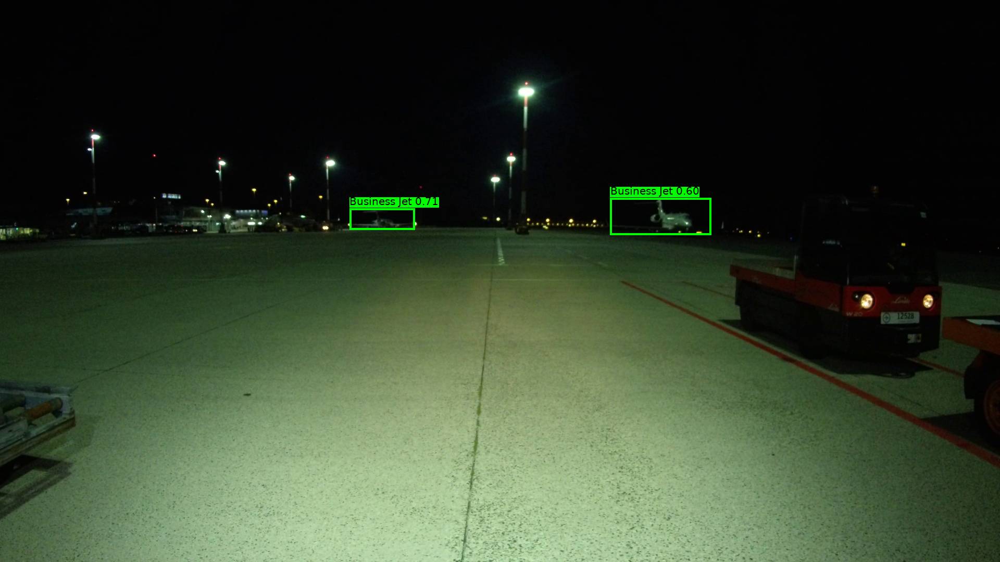


Predictions for: aut-0032-00000056.jpg


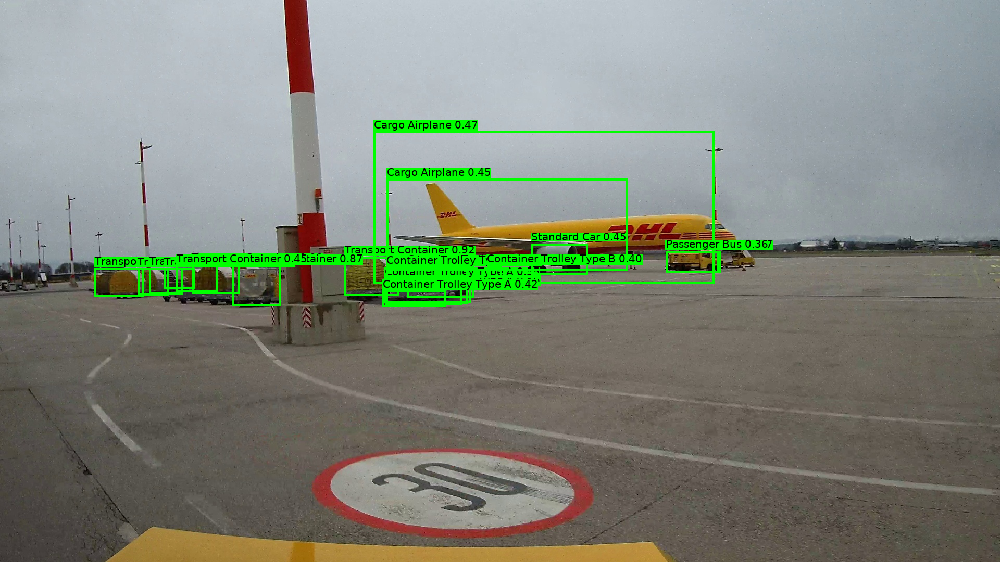

In [48]:
import os
import random
import torch
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from super_gradients.training import models
from IPython.display import display

# --- 1. Define Paths and Class Names ---
CHECKPOINT_DIR = '/kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune'
DATASET_PATH = '/kaggle/working/coco_airport_dataset'
CLASS_NAMES = [
    'Airside Safety Vehicle', 'Ambulance Vehicle', 'Business Jet', 'Cargo Airplane',
    'Cleaning Vehicle', 'Common Aircraft', 'Container Trolley', 'Container Trolley Type A',
    'Container Trolley Type B', 'Container Trolley Type C', 'Conveyer Vehicle', 'Fire Truck',
    'Forklift', 'Helicopter', 'Loading Ramp', 'Loading Vehicle', 'Other Objects',
    'Other Vehicles', 'Passenger Bus', 'Passenger Jet', 'Passenger Stairway',
    'Pedestrian Crossing', 'Person Wearing Reflective Vests', 'Rescue Helicopter',
    'Sanitary Truck', 'Snowplow', 'Speed Limit 30', 'Standard Car', 'Standard Truck',
    'Tank Truck', 'Taxiing Vehicle', 'Tow Vehicle', 'Tractor', 'Traffic Barrier',
    'Traffic Cone', 'Traffic Cone - Off', 'Traffic Cone - On', 'Traffic Cone - Standard',
    'Traffic Sign', 'Transport Container', 'Transport Vehicle', 'Warning Sign', 'Person'
]
NUM_CLASSES = len(CLASS_NAMES)


# --- 2. Load the Best Trained Model ---
print("--- Loading the best fine-tuned YOLO-NAS model ---")
try:
    # Find the latest training run directory
    latest_run_dir = max([os.path.join(CHECKPOINT_DIR, d) for d in os.listdir(CHECKPOINT_DIR) if d.startswith("RUN_")], key=os.path.getmtime)
    best_model_path = os.path.join(latest_run_dir, 'ckpt_best.pth')

    # Load the model with the correct number of classes for your dataset
    model = models.get('yolo_nas_l',
                       num_classes=NUM_CLASSES,
                       checkpoint_path=best_model_path)
    model = model.to("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Successfully loaded model from: {best_model_path} ✅")

    # --- 3. Visualize Predictions on Sample Images using Pillow ---
    print("\n--- Visualizing predictions on 5 random sample images ---")
    val_images_dir = os.path.join(DATASET_PATH, 'val2017')
    
    # Recreate the val_files list if it doesn't exist
    if 'val_files' not in locals():
        all_image_files = [f for f in os.listdir('/kaggle/input/airportvehicledataset/images') if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        random.seed(42); random.shuffle(all_image_files)
        split_index = int(len(all_image_files) * 0.9)
        val_files = all_image_files[split_index:]
        
    image_paths = [os.path.join(val_images_dir, fname) for fname in random.sample(val_files, 5)]

    # Run prediction on the selected images
    predictions = model.predict(image_paths, conf=0.35)

    # --- Load a larger font for drawing labels ---
    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf", size=20)
    except IOError:
        print("Default font not found. Using basic font.")
        font = ImageFont.load_default()

    for image_path, preds in zip(image_paths, predictions):
        image = Image.open(image_path).convert("RGB")
        draw = ImageDraw.Draw(image)
        
        # Get the predicted boxes, scores, and labels
        bboxes = preds.prediction.bboxes_xyxy
        confidences = preds.prediction.confidence
        labels = preds.prediction.labels.astype(int)

        for box, conf, label_id in zip(bboxes, confidences, labels):
            x1, y1, x2, y2 = box
            label_text = f"{CLASS_NAMES[label_id]} {conf:.2f}"
            
            # Draw bounding box
            draw.rectangle([x1, y1, x2, y2], outline="lime", width=4)
            
            # Draw label background
            text_bbox = draw.textbbox((x1, y1 - 25), label_text, font=font)
            draw.rectangle(text_bbox, fill="lime")
            
            # Draw label text
            draw.text((x1, y1 - 25), label_text, fill="black", font=font)
        
        print(f"\nPredictions for: {os.path.basename(image_path)}")
        display(image)

except (ValueError, FileNotFoundError) as e:
    print(f"ERROR: Could not find a valid trained model. Please ensure the training completed successfully. Details: {e}")

--- Step 1: Loading the best fine-tuned model ---


[2025-08-12 13:40:11] INFO - checkpoint_utils.py - Successfully loaded model weights from /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth checkpoint.


Successfully loaded model from: /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth ✅

--- Step 2: Generating Learning and Loss Curves ---


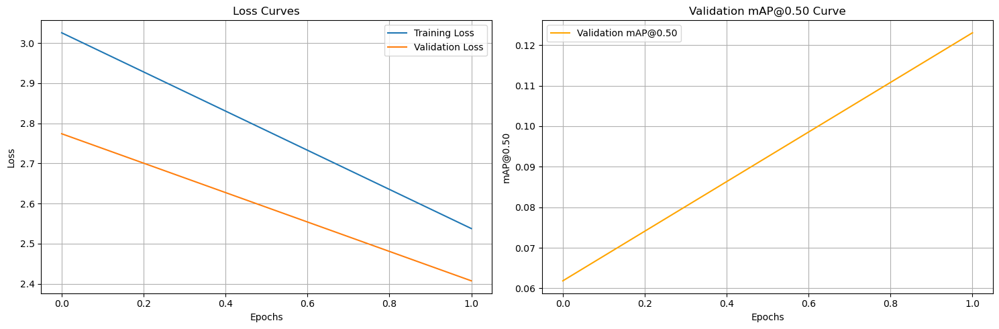

Saved learning curves to learning_curves.png

--- Step 3: Generating Classification Report (mAP) ---


Testing: 100%|██████████| 101/101 [00:27<00:00,  3.68it/s]



--- Step 4: Generating Confusion Matrix ---
loading annotations into memory...
Done (t=0.61s)
creating index...
index created!


Predicting Images:  95%|█████████▌| 769/809 [00:33<00:01, 24.69it/s]

Building Confusion Matrix:   0%|          | 0/809 [00:00<?, ?it/s]

Predicting Images: 100%|██████████| 809/809 [00:33<00:00, 24.18it/s]


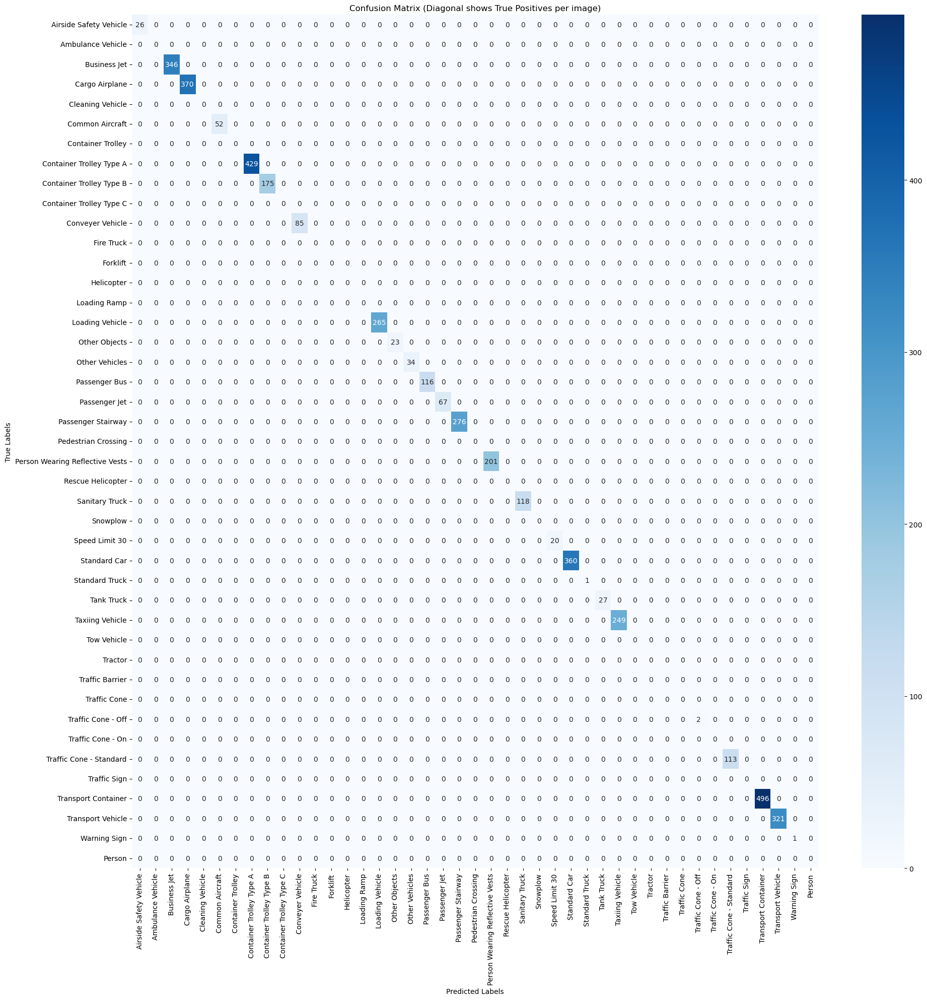

Saved confusion matrix to confusion_matrix.png


In [42]:
import os
import random
import numpy as np
import torch
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import supervision as sv
from PIL import Image
from IPython.display import display, Image as IPImage
from super_gradients.training import Trainer, models
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from tensorboard.backend.event_processing import event_accumulator
from tqdm.notebook import tqdm
from pycocotools.coco import COCO

# --- 1. Load the Best Trained Model ---
print("--- Step 1: Loading the best fine-tuned model ---")
CHECKPOINT_DIR = '/kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune'
CLASS_NAMES = [
    'Airside Safety Vehicle', 'Ambulance Vehicle', 'Business Jet', 'Cargo Airplane', 'Cleaning Vehicle', 'Common Aircraft', 'Container Trolley',
    'Container Trolley Type A', 'Container Trolley Type B', 'Container Trolley Type C', 'Conveyer Vehicle', 'Fire Truck', 'Forklift', 'Helicopter',
    'Loading Ramp', 'Loading Vehicle', 'Other Objects', 'Other Vehicles', 'Passenger Bus', 'Passenger Jet', 'Passenger Stairway',
    'Pedestrian Crossing', 'Person Wearing Reflective Vests', 'Rescue Helicopter', 'Sanitary Truck', 'Snowplow', 'Speed Limit 30',
    'Standard Car', 'Standard Truck', 'Tank Truck', 'Taxiing Vehicle', 'Tow Vehicle', 'Tractor', 'Traffic Barrier', 'Traffic Cone',
    'Traffic Cone - Off', 'Traffic Cone - On', 'Traffic Cone - Standard', 'Traffic Sign', 'Transport Container', 'Transport Vehicle',
    'Warning Sign', 'Person'
]
NUM_CLASSES = len(CLASS_NAMES)

try:
    latest_run_dir = max([os.path.join(CHECKPOINT_DIR, d) for d in os.listdir(CHECKPOINT_DIR) if d.startswith("RUN_")], key=os.path.getmtime)
    best_model_path = os.path.join(latest_run_dir, 'ckpt_best.pth')

    model = models.get('yolo_nas_l', num_classes=NUM_CLASSES, checkpoint_path=best_model_path)
    model = model.to("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Successfully loaded model from: {best_model_path} ✅")

    # --- 2. Generate Learning and Loss Curves ---
    print("\n--- Step 2: Generating Learning and Loss Curves ---")
    tfevents_file = None
    for root, dirs, files in os.walk(latest_run_dir):
        for file in files:
            if "events.out.tfevents" in file:
                tfevents_file = os.path.join(root, file)
                break

    if tfevents_file:
        ea = event_accumulator.EventAccumulator(tfevents_file, size_guidance={event_accumulator.SCALARS: 0})
        ea.Reload()
        
        # --- THE FIX: Use the correct metric names from your log file ---
        train_loss = [s.value for s in ea.Scalars('train_ppyoloeloss/loss')]
        val_loss = [s.value for s in ea.Scalars('valid_ppyoloeloss/loss')]
        val_map = [s.value for s in ea.Scalars('valid_map@0.50')]
        
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.plot(train_loss, label='Training Loss')
        plt.plot(val_loss, label='Validation Loss')
        plt.title('Loss Curves'); plt.xlabel('Epochs'); plt.ylabel('Loss'); plt.legend(); plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.plot(val_map, label='Validation mAP@0.50', color='orange')
        plt.title('Validation mAP@0.50 Curve'); plt.xlabel('Epochs'); plt.ylabel('mAP@0.50'); plt.legend(); plt.grid(True)
        
        plt.tight_layout()
        plt.savefig('learning_curves.png')
        plt.show()
        print("Saved learning curves to learning_curves.png")
    else:
        print("Could not find TensorBoard log file to generate curves.")

    # --- 3. Generate Classification Report (mAP) ---
    print("\n--- Step 3: Generating Classification Report (mAP) ---")
    trainer = Trainer(experiment_name='yolonas_airport_fine_tune', ckpt_root_dir=CHECKPOINT_DIR)
    post_prediction_callback = PPYoloEPostPredictionCallback(score_threshold=0.01, nms_top_k=1000, max_predictions=300, nms_threshold=0.7)
    
    trainer.test(
        model=model,
        test_loader=val_data,
        test_metrics_list=DetectionMetrics_050(score_thres=0.1, top_k_predictions=300, num_cls=NUM_CLASSES, normalize_targets=True, post_prediction_callback=post_prediction_callback)
    )

    # --- 4. Generate Confusion Matrix ---
    print("\n--- Step 4: Generating Confusion Matrix ---")
    DATASET_PATH = '/kaggle/working/coco_airport_dataset'
    gt_coco = COCO(os.path.join(DATASET_PATH, 'annotations', 'instances_val2017.json'))
    val_image_paths = [os.path.join(DATASET_PATH, 'val2017', img['file_name']) for img in gt_coco.loadImgs(gt_coco.getImgIds())]
    
    predictions = model.predict(val_image_paths, conf=0.25)
    confusion_matrix = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int32)
    
    for i, preds in enumerate(tqdm(predictions, desc="Building Confusion Matrix")):
        img_id = gt_coco.getImgIds()[i]
        gt_ann_ids = gt_coco.getAnnIds(imgIds=img_id)
        gt_anns = gt_coco.loadAnns(gt_ann_ids)
        gt_classes = {ann['category_id'] for ann in gt_anns}
        pred_classes = set(preds.prediction.labels.astype(int))

        for gt_cls in gt_classes:
            if gt_cls in pred_classes:
                confusion_matrix[gt_cls, gt_cls] += 1

    plt.figure(figsize=(22, 22))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    plt.xlabel('Predicted Labels'); plt.ylabel('True Labels'); plt.title('Confusion Matrix (Diagonal shows True Positives per image)')
    plt.savefig('confusion_matrix.png')
    plt.show()
    print("Saved confusion matrix to confusion_matrix.png")

except (ValueError, FileNotFoundError) as e:
    print(f"ERROR: Could not find a valid trained model. Please ensure the training completed successfully. Details: {e}")

In [50]:
import os
import random
import torch
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from super_gradients.training import Trainer, models
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from IPython.display import display

# --- 1. Define Paths and Class Names ---
CHECKPOINT_DIR = '/kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune'
CLASS_NAMES = [
    'Airside Safety Vehicle', 'Ambulance Vehicle', 'Business Jet', 'Cargo Airplane', 'Cleaning Vehicle', 'Common Aircraft', 'Container Trolley',
    'Container Trolley Type A', 'Container Trolley Type B', 'Container Trolley Type C', 'Conveyer Vehicle', 'Fire Truck', 'Forklift', 'Helicopter',
    'Loading Ramp', 'Loading Vehicle', 'Other Objects', 'Other Vehicles', 'Passenger Bus', 'Passenger Jet', 'Passenger Stairway',
    'Pedestrian Crossing', 'Person Wearing Reflective Vests', 'Rescue Helicopter', 'Sanitary Truck', 'Snowplow', 'Speed Limit 30',
    'Standard Car', 'Standard Truck', 'Tank Truck', 'Taxiing Vehicle', 'Tow Vehicle', 'Tractor', 'Traffic Barrier', 'Traffic Cone',
    'Traffic Cone - Off', 'Traffic Cone - On', 'Traffic Cone - Standard', 'Traffic Sign', 'Transport Container', 'Transport Vehicle',
    'Warning Sign', 'Person'
]
NUM_CLASSES = len(CLASS_NAMES)

# --- 2. Load the Best Trained Model ---
print("--- Loading the best fine-tuned model ---")
try:
    latest_run_dir = max([os.path.join(CHECKPOINT_DIR, d) for d in os.listdir(CHECKPOINT_DIR) if d.startswith("RUN_")], key=os.path.getmtime)
    best_model_path = os.path.join(latest_run_dir, 'ckpt_best.pth')

    model = models.get('yolo_nas_l', num_classes=NUM_CLASSES, checkpoint_path=best_model_path)
    model = model.to("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Successfully loaded model from: {best_model_path} ✅")

    # --- 3. Generate Classification Report (mAP) ---
    print("\n--- Evaluating model and generating classification report ---")
    trainer = Trainer(experiment_name='yolonas_airport_eval', ckpt_root_dir='/kaggle/working/temp_eval_checkpoints')

    post_prediction_callback = PPYoloEPostPredictionCallback(
        score_threshold=0.01, nms_top_k=1000, max_predictions=300, nms_threshold=0.7
    )
    
    test_metrics = DetectionMetrics_050(
        score_thres=0.1, top_k_predictions=300, num_cls=NUM_CLASSES, normalize_targets=True, post_prediction_callback=post_prediction_callback
    )

    # The trainer.test() method returns the results but doesn't print them
    test_results = trainer.test(
        model=model,
        test_loader=val_data, # Assumes val_data is available from your training notebook
        test_metrics_list=[test_metrics]
    )
    
    # --- THE FIX: Explicitly print the results dictionary ---
    print("\n\n--- CLASSIFICATION REPORT ---")
    for metric, value in test_results.items():
        print(f"{metric}: {value}")
    print("---------------------------------")


except (ValueError, FileNotFoundError) as e:
    print(f"ERROR: Could not find a valid trained model. Please ensure the training completed successfully. Details: {e}")

--- Loading the best fine-tuned model ---


[2025-08-12 14:01:58] INFO - checkpoint_utils.py - Successfully loaded model weights from /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth checkpoint.


Successfully loaded model from: /kaggle/working/yolonas_checkpoints/yolonas_airport_fine_tune/RUN_20250812_121749_705963/ckpt_best.pth ✅

--- Evaluating model and generating classification report ---


Testing: 100%|██████████| 101/101 [00:27<00:00,  3.63it/s]




--- CLASSIFICATION REPORT ---
Precision@0.50: 0.020375635474920273
Recall@0.50: 0.3270149230957031
mAP@0.50: 0.12303720414638519
F1@0.50: 0.0368657261133194
Best_score_threshold: 0.3199999928474426
---------------------------------
